# 1. Import necessary packages

In [1]:
import pandas as pd
import numpy as np
from scipy.stats import skew
from scipy.stats.mstats import winsorize

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="NYC")

# Visualizations
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn-whitegrid')

# Plotly
import plotly
import chart_studio.plotly as py
import plotly.offline as offline
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import cufflinks as cf
from plotly.graph_objs import Scatter, Figure, Layout
cf.set_config_file(offline=True)

# Modeling
import xgboost as xgb
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor


# 2. Load the trip data

In [2]:
trip_data = pd.read_csv('./trip_data_4.csv',nrows = 1000000)
trip_data.head()
trip_data.info()
trip_data.describe()

,medallion,hack_license,vendor_id,rate_code,store_and_fwd_flag,pickup_datetime,dropoff_datetime,passenger_count,trip_time_in_secs,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
0,91F6EB84975BBC867E32CB113C7C2CD5,AD8751110E6292079EB10EB9481FE1A6,CMT,1,N,2013-04-04 18:47:45,2013-04-04 19:00:25,1,759,2.5,-73.957855,40.765320,-73.976273,40.785648
1,EC34CD1B3797DFAFF3FE099BA87B6656,8FE6A4AEDF89B6B4E19D2377FD3FB7D7,CMT,1,N,2013-04-05 07:08:34,2013-04-05 07:17:34,1,540,1.6,0.000000,0.000000,0.000000,0.000000
2,C1B9DA774DC2BBC6DE27CE994E7F44A0,E1B595FD55E4C82C1E213EB17438107A,CMT,1,N,2013-04-04 17:59:50,2013-04-04 18:21:48,1,1318,3.6,-73.982880,40.754990,-74.009186,40.715374
3,9BA84250355AB3FC031C9252D395BF8A,16BB0D96A0DCC853AEC7F55C8D6C71E0,CMT,1,N,2013-04-04 18:12:01,2013-04-04 18:25:24,1,799,1.9,-73.978119,40.763451,-73.955666,40.776642
4,205A696DF62AD03C88DA8C5EC5248639,579C41EA5EC846F8B641A42F9EE3E855,CMT,1,N,2013-04-04 20:12:57,2013-04-04 20:29:55,1,1017,3.6,-74.006371,40.744755,-73.961662,40.761082


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 14 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   medallion            1000000 non-null  object 
 1    hack_license        1000000 non-null  object 
 2    vendor_id           1000000 non-null  object 
 3    rate_code           1000000 non-null  int64  
 4    store_and_fwd_flag  447554 non-null   object 
 5    pickup_datetime     1000000 non-null  object 
 6    dropoff_datetime    1000000 non-null  object 
 7    passenger_count     1000000 non-null  int64  
 8    trip_time_in_secs   1000000 non-null  int64  
 9    trip_distance       1000000 non-null  float64
 10   pickup_longitude    1000000 non-null  float64
 11   pickup_latitude     1000000 non-null  float64
 12   dropoff_longitude   1000000 non-null  float64
 13   dropoff_latitude    1000000 non-null  float64
dtypes: float64(5), int64(3), object(6)
memory usage: 10

,rate_code,passenger_count,trip_time_in_secs,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
count,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000
mean,1.032468,1.781285,721.049978,2.936892,-72.782125,40.090081,-72.740850,40.067776
std,0.268745,1.442645,525.052336,3.341762,9.321769,8.723982,9.629037,7.167915
min,0.000000,0.000000,0.000000,0.000000,-99.550003,-3117.554200,-736.533330,-3113.277600
25%,1.000000,1.000000,360.000000,1.100000,-73.992653,40.732792,-73.991920,40.731796
50%,1.000000,1.000000,600.000000,1.860000,-73.982338,40.751137,-73.980865,40.751743
75%,1.000000,2.000000,927.000000,3.320000,-73.967522,40.766586,-73.963262,40.768143
max,6.000000,6.000000,10607.000000,94.800000,0.000000,3210.384500,1428.738300,403.980010


In [3]:
trip_data.isna().sum()

medallion                   0
 hack_license               0
 vendor_id                  0
 rate_code                  0
 store_and_fwd_flag    552446
 pickup_datetime            0
 dropoff_datetime           0
 passenger_count            0
 trip_time_in_secs          0
 trip_distance              0
 pickup_longitude           0
 pickup_latitude            0
 dropoff_longitude          0
 dropoff_latitude           0
dtype: int64

Notes:
    <br>* There are trips with no passengers/zero distance/zero trip time which looks anomolous
    <br>* The latitude and longitude values have a huge variance and there are many values which are invalid
    <br>Ref : https://stackoverflow.com/questions/15965166/what-are-the-lengths-of-location-coordinates-latitude-and-longitude

In [4]:
# Remove the whtespace at the beginning of column names
trip_data.columns = [item.strip() for item in trip_data.columns]

#Convert the pickup & dropoff timestamps to datetime format
trip_data.pickup_datetime = pd.to_datetime(trip_data.pickup_datetime)
trip_data.dropoff_datetime = pd.to_datetime(trip_data.dropoff_datetime)

In [5]:
# Dropping the store_and_fwd_flag column which has lots of missing values
trip_data = trip_data.drop(['store_and_fwd_flag'],axis=1)

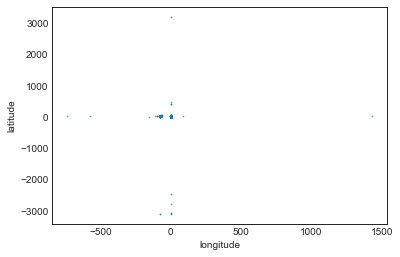

In [6]:
# Sanity Check Latitude and Longitude Values
longitude = list(trip_data.pickup_longitude) + list(trip_data.dropoff_longitude)
latitude = list(trip_data.pickup_latitude) + list(trip_data.dropoff_latitude)

trip_data2 = pd.DataFrame({'latitude': latitude, 'longitude': longitude})
sns.set_style("white")
ax = sns.regplot(x="longitude", y="latitude", data=trip_data2, scatter=True, fit_reg=False, scatter_kws={"s": 0.3})
plt.show()

<AxesSubplot:xlabel='pickup_longitude', ylabel='pickup_latitude'>

<AxesSubplot:xlabel='dropoff_longitude', ylabel='dropoff_latitude'>

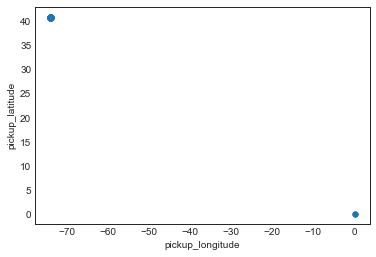

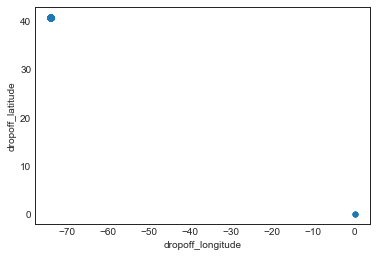

In [7]:
#Plot the lat long values, with only first 1000 (for efficiency)
trip_data.iloc[:1000].plot.scatter('pickup_longitude', 'pickup_latitude')
trip_data.iloc[:1000].plot.scatter('dropoff_longitude', 'dropoff_latitude')

We have lots of outliers in the data here. The NYC Latitude & Longitude ranges are between aproximately: 40 & -73. Lets filter our data accordingly

<br>
<img src="NYCcoord.PNG" alt="Drawing" style="width: 700px;"/>


In [8]:
# Set the limit values or latitude and longitude based on NYC coordinates and filter the data
longitude_limit = [-80, -70]
latitude_limit = [38, 48]
trip_data = trip_data[(trip_data.pickup_longitude.between(longitude_limit[0], longitude_limit[1], inclusive=False))]
trip_data = trip_data[(trip_data.dropoff_longitude.between(longitude_limit[0], longitude_limit[1], inclusive=False))]
trip_data = trip_data[(trip_data.pickup_latitude.between(latitude_limit[0], latitude_limit[1], inclusive=False))]
trip_data = trip_data[(trip_data.dropoff_latitude.between(latitude_limit[0], latitude_limit[1], inclusive=False))]

## Note: The plots are interactive

In [9]:
# Visualize pick up Locations in NewYork
data = [go.Scattermapbox(
            lat= trip_data[:10000]['pickup_latitude'] ,
            lon= trip_data[:10000]['pickup_longitude'],
            customdata = trip_data[:10000]['pickup_datetime'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'gold',
                opacity = .8,
            ),
          )]
layout = go.Layout(autosize=False,
                   mapbox= dict(accesstoken="pk.eyJ1Ijoic2hhejEzIiwiYSI6ImNqYXA3NjhmeDR4d3Iyd2w5M2phM3E2djQifQ.yyxsAzT94VGYYEEOhxy87w",
                                bearing=10,
                                pitch=60,
                                zoom=13,
                                center= dict(
                                         lat=40.721319,
                                         lon=-73.987130),
                                style= "mapbox://styles/shaz13/cjiog1iqa1vkd2soeu5eocy4i"),
                    width=900,
                    height=600, title = "Pick up Locations in NewYork")
fig = dict(data=data, layout=layout)
iplot(fig)

In [10]:
# Visualize drop off Locations in NewYork
data = [go.Scattermapbox(
            lat= trip_data[:10000]['dropoff_latitude'] ,
            lon= trip_data[:10000]['dropoff_longitude'],
            customdata = trip_data[:10000]['dropoff_datetime'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'cyan',
                opacity = .8,
            ),
          )]
layout = go.Layout(autosize=False,
                   mapbox= dict(accesstoken="pk.eyJ1Ijoic2hhejEzIiwiYSI6ImNqYXA3NjhmeDR4d3Iyd2w5M2phM3E2djQifQ.yyxsAzT94VGYYEEOhxy87w",
                                bearing=10,
                                pitch=60,
                                zoom=13,
                                center= dict(
                                         lat=40.721319,
                                         lon=-73.987130),
                                style= "mapbox://styles/shaz13/cjk4wlc1s02bm2smsqd7qtjhs"),
                    width=900,
                    height=600, title = "Drop off locations in Newyork")
fig = dict(data=data, layout=layout)
iplot(fig)

In [11]:
# Trips with trip time = 0
trip_data[trip_data.trip_time_in_secs==0].shape[0]

773

In [12]:
# Trips with trip distance = 0
trip_data[trip_data.trip_distance==0].shape[0]

6625

In [13]:
# Trips with passenger count = 0
trip_data[trip_data.passenger_count==0].shape[0]

2

In [14]:
# Dropping these above erroneous trips
trip_data = trip_data[trip_data.trip_time_in_secs>0]
trip_data = trip_data[trip_data.trip_distance>0.0]
trip_data = trip_data[trip_data.passenger_count>0.0]

In [15]:
# Check percentage distribution of rate codes
trip_data.rate_code.value_counts(normalize=True)*100

1    98.146129
2     1.509890
3     0.139294
5     0.122792
4     0.078206
0     0.003382
6     0.000307
Name: rate_code, dtype: float64

Using the information available at: http://www.nyc.gov/html/tlc/html/passenger/taxicab_rate.shtml 

* Rate Code 1 = Standard City Rate
* Rate Code 2 = JFK Airport Rate
* Rate Code 3 = La Guardia Airport Rate
* Rate Code 4 = Westchester/Nassau County Rates
* Rate Code 5 = Out of City Rate with negotiated flat fare

In [16]:
# CHeck the number of unique vendors, taxis & drivers
trip_data.vendor_id.value_counts()
trip_data.medallion.nunique()
trip_data.hack_license.nunique()

VTS    543260
CMT    432374
Name: vendor_id, dtype: int64

13105

29800

In [17]:
trip_data.shape

(975634, 13)

# 3. Load fare amount data

In [18]:
trip_fare = pd.read_csv('./trip_fare_4.csv',nrows = 1000000)
trip_fare.head()
trip_fare.info()
trip_fare.describe()

,medallion,hack_license,vendor_id,pickup_datetime,payment_type,fare_amount,surcharge,mta_tax,tip_amount,tolls_amount,total_amount
0,91F6EB84975BBC867E32CB113C7C2CD5,AD8751110E6292079EB10EB9481FE1A6,CMT,2013-04-04 18:47:45,CRD,11.0,1.0,0.5,2.50,0.0,15.00
1,EC34CD1B3797DFAFF3FE099BA87B6656,8FE6A4AEDF89B6B4E19D2377FD3FB7D7,CMT,2013-04-05 07:08:34,CRD,8.5,0.0,0.5,1.80,0.0,10.80
2,C1B9DA774DC2BBC6DE27CE994E7F44A0,E1B595FD55E4C82C1E213EB17438107A,CMT,2013-04-04 17:59:50,CRD,16.5,1.0,0.5,3.60,0.0,21.60
3,9BA84250355AB3FC031C9252D395BF8A,16BB0D96A0DCC853AEC7F55C8D6C71E0,CMT,2013-04-04 18:12:01,CRD,10.0,1.0,0.5,3.45,0.0,14.95
4,205A696DF62AD03C88DA8C5EC5248639,579C41EA5EC846F8B641A42F9EE3E855,CMT,2013-04-04 20:12:57,CRD,15.0,0.5,0.5,3.20,0.0,19.20


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 11 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   medallion         1000000 non-null  object 
 1    hack_license     1000000 non-null  object 
 2    vendor_id        1000000 non-null  object 
 3    pickup_datetime  1000000 non-null  object 
 4    payment_type     1000000 non-null  object 
 5    fare_amount      1000000 non-null  float64
 6    surcharge        1000000 non-null  float64
 7    mta_tax          1000000 non-null  float64
 8    tip_amount       1000000 non-null  float64
 9    tolls_amount     1000000 non-null  float64
 10   total_amount     1000000 non-null  float64
dtypes: float64(6), object(5)
memory usage: 83.9+ MB


,fare_amount,surcharge,mta_tax,tip_amount,tolls_amount,total_amount
count,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000,1000000.000000
mean,12.247056,0.265426,0.498331,1.275131,0.218016,14.503959
std,9.889594,0.302428,0.028844,2.093110,1.129650,11.765387
min,2.500000,0.000000,0.000000,0.000000,0.000000,2.500000
25%,6.500000,0.000000,0.500000,0.000000,0.000000,8.000000
50%,9.500000,0.000000,0.500000,0.010000,0.000000,11.000000
75%,14.000000,0.500000,0.500000,2.000000,0.000000,16.200000
max,385.000000,3.000000,0.500000,200.000000,20.000000,490.830000


Notes:
    <br> * There are no anomolous datapoints in the fare data

In [19]:
# Remove the whtespace at the beginning of column names & parse dates as datetime object
trip_fare.columns = [item.strip() for item in trip_fare.columns]
trip_fare.pickup_datetime = pd.to_datetime(trip_fare.pickup_datetime)

In [20]:
trip_fare.isna().sum()

medallion          0
hack_license       0
vendor_id          0
pickup_datetime    0
payment_type       0
fare_amount        0
surcharge          0
mta_tax            0
tip_amount         0
tolls_amount       0
total_amount       0
dtype: int64

# Merge trip data & trip fare dataframes together

In [21]:
taxi_df = trip_data.merge(trip_fare, on=['medallion','hack_license','vendor_id','pickup_datetime'], how='inner')
taxi_df.head()
taxi_df.shape

,medallion,hack_license,vendor_id,rate_code,pickup_datetime,dropoff_datetime,passenger_count,trip_time_in_secs,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,mta_tax,tip_amount,tolls_amount,total_amount
0,91F6EB84975BBC867E32CB113C7C2CD5,AD8751110E6292079EB10EB9481FE1A6,CMT,1,2013-04-04 18:47:45,2013-04-04 19:00:25,1,759,2.5,-73.957855,40.765320,-73.976273,40.785648,CRD,11.0,1.0,0.5,2.50,0.0,15.00
1,C1B9DA774DC2BBC6DE27CE994E7F44A0,E1B595FD55E4C82C1E213EB17438107A,CMT,1,2013-04-04 17:59:50,2013-04-04 18:21:48,1,1318,3.6,-73.982880,40.754990,-74.009186,40.715374,CRD,16.5,1.0,0.5,3.60,0.0,21.60
2,9BA84250355AB3FC031C9252D395BF8A,16BB0D96A0DCC853AEC7F55C8D6C71E0,CMT,1,2013-04-04 18:12:01,2013-04-04 18:25:24,1,799,1.9,-73.978119,40.763451,-73.955666,40.776642,CRD,10.0,1.0,0.5,3.45,0.0,14.95
3,205A696DF62AD03C88DA8C5EC5248639,579C41EA5EC846F8B641A42F9EE3E855,CMT,1,2013-04-04 20:12:57,2013-04-04 20:29:55,1,1017,3.6,-74.006371,40.744755,-73.961662,40.761082,CRD,15.0,0.5,0.5,3.20,0.0,19.20
4,EE75E5927D00739AC342810C336A825E,1B4E92431F9DA4D49874EC76E769E874,CMT,1,2013-04-05 02:48:11,2013-04-05 02:51:21,2,189,0.7,-73.985191,40.754932,-73.990776,40.747997,CRD,4.5,0.5,0.5,1.10,0.0,6.60


(975643, 20)

In [22]:
taxi_df.columns

Index(['medallion', 'hack_license', 'vendor_id', 'rate_code',
       'pickup_datetime', 'dropoff_datetime', 'passenger_count',
       'trip_time_in_secs', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'payment_type', 'fare_amount', 'surcharge', 'mta_tax', 'tip_amount',
       'tolls_amount', 'total_amount'],
      dtype='object')

In [23]:
# Create a feature to determine the speed of taxicabs.
taxi_df['speed'] = 1.0*taxi_df.trip_distance/(taxi_df.trip_time_in_secs/3600.0)
taxi_df.speed.describe()

count    975643.000000
mean         15.589828
std         170.924534
min           0.017647
25%           9.375000
50%          12.500000
75%          16.680000
max       66600.000000
Name: speed, dtype: float64

The above max value for speed in the city limits is highly inconsistent. Hence, curbing the speed at 250mph

In [24]:
# Curbing the speed at 250mph
taxi_df[taxi_df.speed > 250.0][['trip_distance','trip_time_in_secs','speed']]

,trip_distance,trip_time_in_secs,speed
54,4.40,1,15840.000000
34376,4.37,60,262.200000
169747,10.30,114,325.263158
504595,18.70,165,408.000000
505268,8.60,119,260.168067
...,...,...,...
970213,1.40,1,5040.000000
971299,1.70,3,2040.000000
973875,8.40,97,311.752577
974289,4.20,44,343.636364


Summary of Final merged dataframe:

In [25]:
print("Number of trips :",taxi_df.shape[0])
print("Number of unique Vendors :",taxi_df.vendor_id.nunique())
print("Number of unique Taxis :",taxi_df.medallion.nunique())
print("Number of unique Drivers :",taxi_df.hack_license.nunique())

taxi_df.info()
taxi_df.describe()

Number of trips : 975643
Number of unique Vendors : 2
Number of unique Taxis : 13105
Number of unique Drivers : 29800
<class 'pandas.core.frame.DataFrame'>
Int64Index: 975643 entries, 0 to 975642
Data columns (total 21 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   medallion          975643 non-null  object        
 1   hack_license       975643 non-null  object        
 2   vendor_id          975643 non-null  object        
 3   rate_code          975643 non-null  int64         
 4   pickup_datetime    975643 non-null  datetime64[ns]
 5   dropoff_datetime   975643 non-null  datetime64[ns]
 6   passenger_count    975643 non-null  int64         
 7   trip_time_in_secs  975643 non-null  int64         
 8   trip_distance      975643 non-null  float64       
 9   pickup_longitude   975643 non-null  float64       
 10  pickup_latitude    975643 non-null  float64       
 11  dropoff_longitude  975643 non-null  fl

,rate_code,passenger_count,trip_time_in_secs,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,fare_amount,surcharge,mta_tax,tip_amount,tolls_amount,total_amount,speed
count,975643.000000,975643.000000,975643.000000,975643.000000,975643.000000,975643.000000,975643.000000,975643.000000,975643.000000,975643.000000,975643.000000,975643.000000,975643.000000,975643.000000,975643.000000
mean,1.025129,1.786835,723.730713,2.965599,-73.976201,40.749808,-73.974941,40.750494,12.162489,0.266293,0.498837,1.264835,0.213803,14.406257,15.589828
std,0.216435,1.447578,521.392411,3.344744,0.036158,0.029096,0.034992,0.032679,9.524102,0.302246,0.024084,2.041181,1.117440,11.377051,170.924534
min,0.000000,1.000000,1.000000,0.010000,-78.536598,40.184036,-77.416664,40.184544,2.500000,0.000000,0.000000,0.000000,0.000000,3.000000,0.017647
25%,1.000000,1.000000,360.000000,1.100000,-73.992882,40.733818,-73.992104,40.733170,6.500000,0.000000,0.500000,0.000000,0.000000,8.000000,9.375000
50%,1.000000,1.000000,600.000000,1.890000,-73.982635,40.751556,-73.981262,40.752285,9.500000,0.000000,0.500000,0.500000,0.000000,11.000000,12.500000
75%,1.000000,2.000000,931.000000,3.370000,-73.968658,40.766975,-73.964661,40.768391,14.000000,0.500000,0.500000,2.000000,0.000000,16.200000,16.680000
max,6.000000,6.000000,10260.000000,94.800000,-71.300003,46.844273,-71.246964,45.883331,385.000000,3.000000,0.500000,200.000000,20.000000,490.830000,66600.000000


# 4. Basic Questions

Distribution of features:
* The distribution of a feature can be represented by a histogram. A histogram aims to approximate the underlying probability density function that generated the data by binning and counting observations.

* Kernel density estimation (KDE) presents a different solution to the same problem. Rather than using discrete bins, a KDE plot smooths the observations with a Gaussian kernel, producing a continuous density estimate

* Another plot for showing the distribution of a single variable is the empirical cumulative distribution function. This shows the percentile on the y-axis and the variable on the x-axis and gets around some of the issues associated with binning data for histograms or the kernel width of the KDE. This plot is good for viewing outliers and also the percentiles of a distribution.

* Also, summary statistics such as mean, median, min, max and standard deviation gives a good idea about the distribution of the feature.

## a. Distribution of number of passengers per trip

In [26]:
# Get count of each unique item (number of passengers per trip)
taxi_df['passenger_count'].value_counts()

1    667244
2    133342
5     65395
3     43918
6     43840
4     21904
Name: passenger_count, dtype: int64

In [27]:
# Get percentages for each unique item
taxi_df['passenger_count'].value_counts()/taxi_df['passenger_count'].value_counts().sum()

1    0.683902
2    0.136671
5    0.067028
3    0.045014
6    0.044934
4    0.022451
Name: passenger_count, dtype: float64

<AxesSubplot:xlabel='passenger_count', ylabel='Count'>

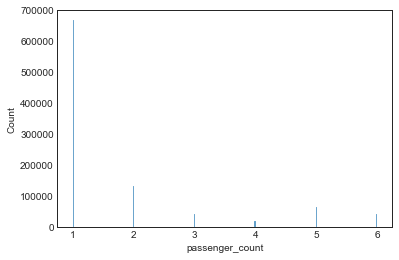

In [28]:
sns.histplot(taxi_df, x="passenger_count")

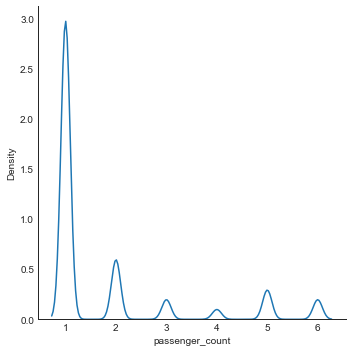

In [29]:
sns.displot(taxi_df, x="passenger_count",kind='kde')

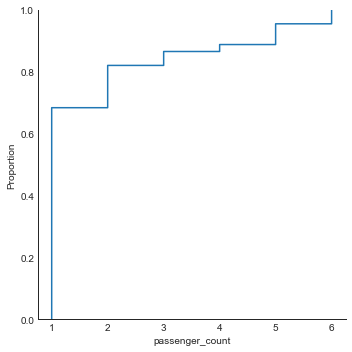

In [30]:
sns.displot(taxi_df, x="passenger_count",kind='ecdf')

In [31]:
taxi_df['passenger_count'].describe()

count    975643.000000
mean          1.786835
std           1.447578
min           1.000000
25%           1.000000
50%           1.000000
75%           2.000000
max           6.000000
Name: passenger_count, dtype: float64

In [32]:
skew(taxi_df['passenger_count'])

1.838221842043377

### Summary:
* The mode is 1 passenger which means most of the taxis are hailed by a single passenger. As we see from the valuecounts for each category, almost 68% of the trips are with a single passenger
* More cabs are hailed by a single passenger than the total number of cabs hailed by two or more passengers as shown in the histogram above
* As shown in the histogram, the distribution is right-skewed (or Positive skewed) with skewness of ~1.84. Since this is ordinal data, calculating skewness makes sense


## b. Distribution of number of payment type

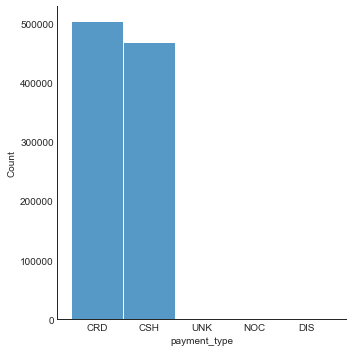

In [33]:
sns.displot(taxi_df, x="payment_type")

In [34]:
taxi_df['payment_type'].describe()

count     975643
unique         5
top          CRD
freq      504605
Name: payment_type, dtype: object

In [35]:
taxi_df['payment_type'].value_counts()

CRD    504605
CSH    468714
NOC      1551
DIS       572
UNK       201
Name: payment_type, dtype: int64

In [36]:
taxi_df['payment_type'].value_counts()/taxi_df['payment_type'].value_counts().sum()

CRD    0.517203
CSH    0.480415
NOC    0.001590
DIS    0.000586
UNK    0.000206
Name: payment_type, dtype: float64

### Summary:
* There are 5 unique payment types : CRD, CSH, NOC, DIS & UNK
* The most popular payment type is CRD. CSH is also as popular as CRD. Both of them constitute ~99% of the data as seen from the valuecounts 
* As shown in the histogram, the distribution is right-skewed (or Positive skewed). But since the feature is categorical, measuring metrics like skewness does not make sense here

## c. Distribution of fare_amount

<AxesSubplot:xlabel='fare_amount', ylabel='Count'>

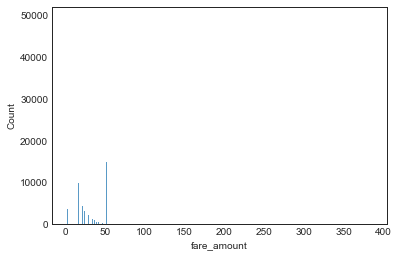

In [37]:
sns.histplot(taxi_df, x="fare_amount")

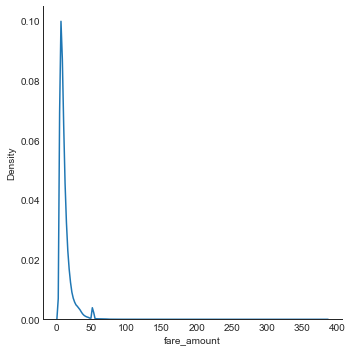

In [38]:
sns.displot(taxi_df, x="fare_amount",kind='kde')

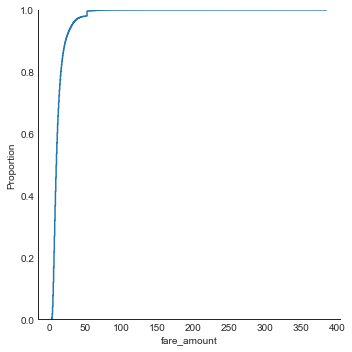

In [39]:
sns.displot(taxi_df, x="fare_amount",kind='ecdf')

In [40]:
taxi_df['fare_amount'].describe()

count    975643.000000
mean         12.162489
std           9.524102
min           2.500000
25%           6.500000
50%           9.500000
75%          14.000000
max         385.000000
Name: fare_amount, dtype: float64

In [41]:
skew(taxi_df['fare_amount'])

3.311451340784177

There seems to have a lot of outlier points in the data. Hence Winsorizing the data by removing the top & bottom 1% of values

Text(0.5, 0, 'Fare Amount')

Text(0.5, 0, 'Winsorized Fare Amount - removed top/bottom 1%')

Text(0.5, 0.98, 'Distribution of Fare Amount')

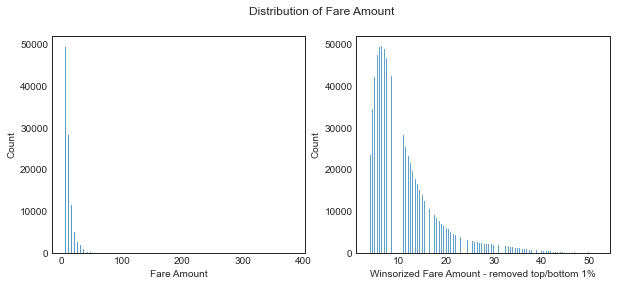

In [42]:
(fig, ax) = plt.subplots(1,2, figsize=(10,4))
ax[0] = sns.histplot(taxi_df.fare_amount, ax=ax[0], kde=False)

# Remove top and bottom 1% of fare amounts (Winsorizing)
ax[1] = sns.histplot(winsorize(taxi_df.fare_amount, limits=[0.01, 0.01]), ax=ax[1], kde=False)
ax[0].set_xlabel('Fare Amount')
ax[1].set_xlabel('Winsorized Fare Amount - removed top/bottom 1%')
fig.suptitle('Distribution of Fare Amount')

In [43]:
# Get statistics afte winsorizing
winsorized_fare_amt = winsorize(taxi_df.fare_amount, limits=[0.01, 0.01])
pd.Series(winsorized_fare_amt).describe()

count    975643.000000
mean         12.097950
std           9.059706
min           3.500000
25%           6.500000
50%           9.500000
75%          14.000000
max          52.000000
dtype: float64

In [44]:
print("Percentage of trips with Fare=$52 :")
print(round(100*taxi_df[taxi_df.fare_amount==52].shape[0]/taxi_df.shape[0],2),"%")

Percentage of trips with Fare=$52 :
1.52 %


Examine fares for Airport rides

C:\Users\H437006\Anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Airport Trips Fare Amount Distribution')

Text(0.5, 0, 'Fare Amount')

Text(0, 0.5, 'Number of Trips')

count    16093.000000
mean        53.144560
std          4.223352
min         52.000000
25%         52.000000
50%         52.000000
75%         52.000000
max         74.500000
dtype: float64

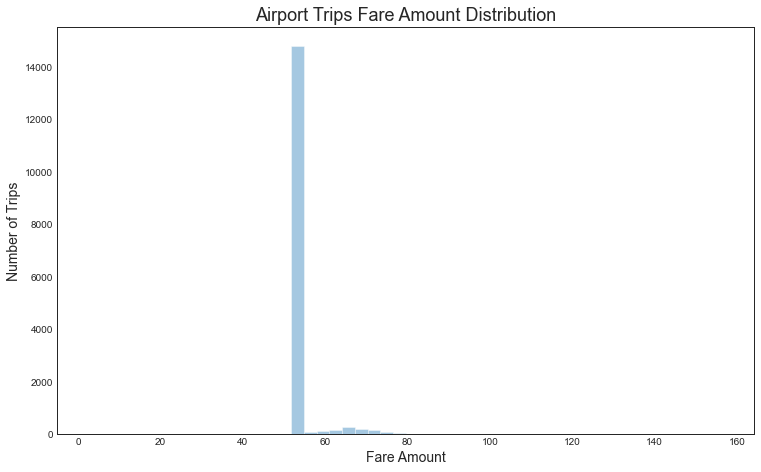

In [45]:
airport_fare = taxi_df.copy()
airport_fare = airport_fare[(airport_fare.rate_code == 2) | (airport_fare.rate_code == 3) ]

(fig, ax) = plt.subplots(figsize=(12.5,7.5))
ax = sns.distplot(airport_fare.fare_amount, kde=False)
ax.set_title('Airport Trips Fare Amount Distribution', fontsize=18)
ax.set_xlabel('Fare Amount', fontsize=14)
ax.set_ylabel('Number of Trips', fontsize=14)

winsorized_airport_fare_amt = winsorize(airport_fare.fare_amount, limits=[0.01, 0.01])
pd.Series(winsorized_airport_fare_amt).describe()

### Summary:
* The lowest fair for taxi is \\$2.50 which matches with the rates given at: https://www1.nyc.gov/site/tlc/passengers/taxi-fare.page
* As shown in the histogram, the distribution is right-skewed (or Positive skewed). The skewness is ~1.85
* The most expensive trip was for \\$385 , but most of the trips are under \\$50
* After Winsorizing, the median fare amount is \\$9.5
* Also there is an interesting spike at \\$52 which could be because of airport rides as per information available at : http://www.nyc.gov/html/tlc/html/passenger/taxicab_rate.shtml 
I have verified this from the data as well

## d. Distribution of tip_amount

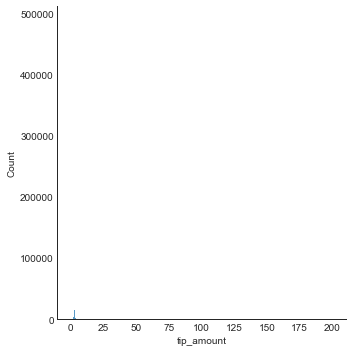

In [46]:
sns.displot(taxi_df, x="tip_amount")

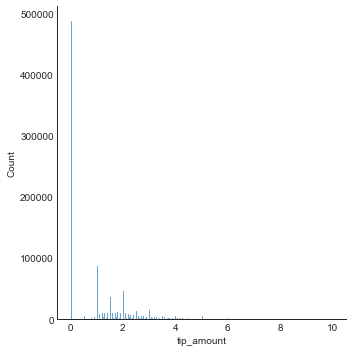

In [47]:
sns.displot(taxi_df[taxi_df.tip_amount<10], x="tip_amount")

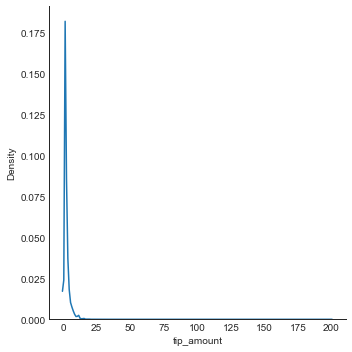

In [48]:
sns.displot(taxi_df, x="tip_amount",kind='kde')

In [49]:
taxi_df['tip_amount'].describe()

count    975643.000000
mean          1.264835
std           2.041181
min           0.000000
25%           0.000000
50%           0.500000
75%           2.000000
max         200.000000
Name: tip_amount, dtype: float64

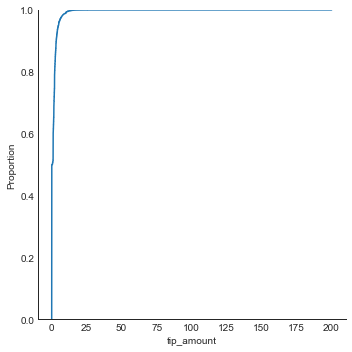

In [50]:
sns.displot(taxi_df, x="tip_amount",kind='ecdf')

In [51]:
taxi_df['tip_amount'].describe()

count    975643.000000
mean          1.264835
std           2.041181
min           0.000000
25%           0.000000
50%           0.500000
75%           2.000000
max         200.000000
Name: tip_amount, dtype: float64

In [52]:
skew(taxi_df['tip_amount'])

6.276159340896699

Text(0.5, 0, 'Tip Amount')

Text(0.5, 0, 'Winsorized Tip Amount - removed top/bottom 1%')

Text(0.5, 0.98, 'Distribution of Tip Amount')

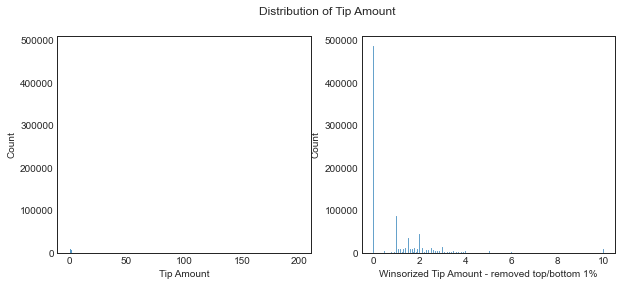

In [53]:
(fig, ax) = plt.subplots(1,2, figsize=(10,4))
ax[0] = sns.histplot(taxi_df.tip_amount, ax=ax[0], kde=False)

# Remove top and bottom 1% of fare amounts
ax[1] = sns.histplot(winsorize(taxi_df.tip_amount, limits=[0.01, 0.01]), ax=ax[1], kde=False)
ax[0].set_xlabel('Tip Amount')
ax[1].set_xlabel('Winsorized Tip Amount - removed top/bottom 1%')
fig.suptitle('Distribution of Tip Amount')

In [54]:
print("Percentage of trips with no tips:")
print(round(100*taxi_df[taxi_df.tip_amount==0].shape[0]/taxi_df.shape[0],2),"%")

Percentage of trips with no tips:
49.86 %


### Summary:
* Most passengers don’t appear to tip well
* ~50% of the trips do not have a tip amount. This could also be because of issue in reporting tips correctly by the drivers of some errors with data collection
* As shown in the histogram, the distribution is heavily right-skewed (or Positive skewed). 


## e. Distribution of total_amount

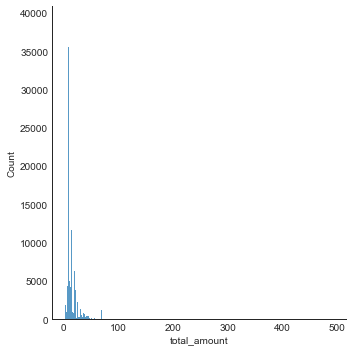

In [55]:
sns.displot(taxi_df, x="total_amount")

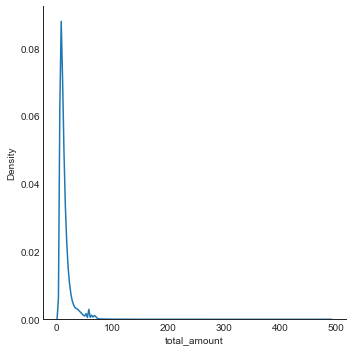

In [56]:
sns.displot(taxi_df, x="total_amount",kind='kde')

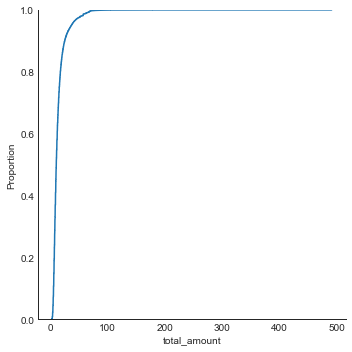

In [57]:
sns.displot(taxi_df, x="total_amount",kind='ecdf')

In [58]:
taxi_df['total_amount'].describe()

count    975643.000000
mean         14.406257
std          11.377051
min           3.000000
25%           8.000000
50%          11.000000
75%          16.200000
max         490.830000
Name: total_amount, dtype: float64

In [59]:
skew(taxi_df['total_amount'])

3.3846664022976363

Text(0.5, 0, 'Total Amount')

Text(0.5, 0, 'Winsorized Total Amount - removed top/bottom 1%')

Text(0.5, 0.98, 'Distribution of Total Amount')

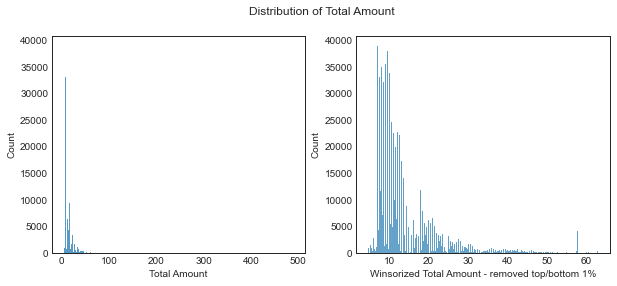

In [60]:
(fig, ax) = plt.subplots(1,2, figsize=(10,4))
ax[0] = sns.histplot(taxi_df.total_amount, ax=ax[0], kde=False)

# Remove top and bottom 1% of fare amounts
ax[1] = sns.histplot(winsorize(taxi_df.total_amount, limits=[0.01, 0.01]), ax=ax[1], kde=False)
ax[0].set_xlabel('Total Amount')
ax[1].set_xlabel('Winsorized Total Amount - removed top/bottom 1%')
fig.suptitle('Distribution of Total Amount')

In [61]:
#Get summary statistics after winsorizing
winsorized_tot_amt = winsorize(taxi_df.total_amount, limits=[0.01, 0.01])
pd.Series(winsorized_tot_amt).describe()

count    975643.000000
mean         14.298165
std          10.658230
min           4.500000
25%           8.000000
50%          11.000000
75%          16.200000
max          63.000000
dtype: float64

### Summary:
* Since the tip amounts are really low, the total amount is bound to follow similar distribution as fare amount
* As shown in the histogram, the distribution is right-skewed (or Positive skewed). 
* Winsorizing total amount shows the median amount to be ~\\$11

## f. Top 5 busiest hours of the day

In [62]:
# Create the Hour column from the pickup time
taxi_df['Hour'] = taxi_df.pickup_datetime.apply(lambda t: t.hour)
taxi_df['DayofWeek'] = trip_data.pickup_datetime.apply(lambda t: t.weekday())

<AxesSubplot:xlabel='Hour', ylabel='Count'>

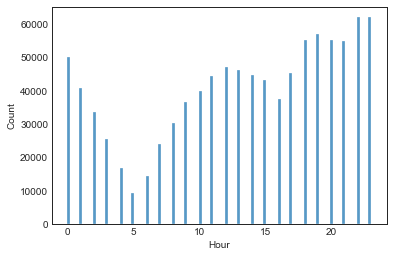

In [63]:
sns.histplot(taxi_df, x="Hour")

In [64]:
# Get the top 5 hours with the maximum number of datapoints (trips)
taxi_df.Hour.value_counts()[:5]

22    61990
23    61969
19    56834
18    55215
20    55195
Name: Hour, dtype: int64

Based on the number of passengers hailing taxi, we can check how the busiest hours differ

In [65]:
# Get the top 5 hours with the maximum number of passengers
passenger_sum = taxi_df.groupby(taxi_df.pickup_datetime.dt.hour)['passenger_count'].sum().sort_values(ascending=False).head()
passenger_sum = passenger_sum.to_frame().reset_index()
passenger_sum = passenger_sum.rename(columns={'pickup_datetime': 'hour'})
passenger_sum_df = passenger_sum.copy()
passenger_sum_df

,hour,passenger_count
0,23,116862
1,22,113822
2,19,100618
3,21,98145
4,18,97989


The busiest hours could be different for different days. To check this, I'm checking the busient hours for each day:

Text(0.5, 64.5, 'Day of Week')

Text(91.5, 0.5, 'Hour of Day')

Text(0.5, 1.0, 'Number of trips')

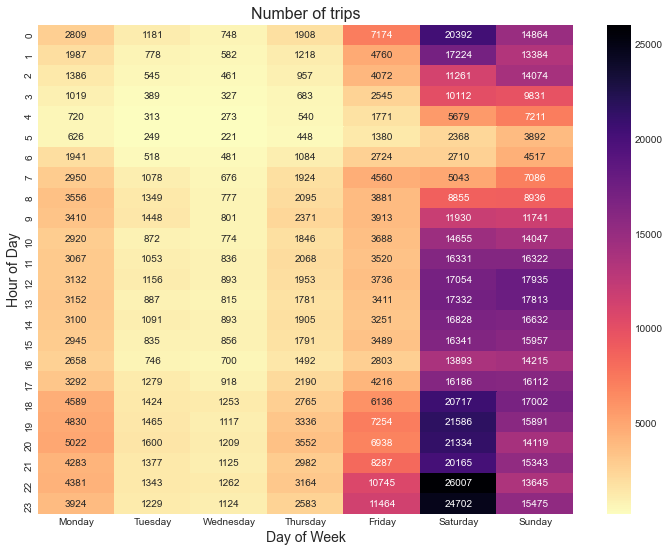

In [66]:
# What are the busiest days and hours for taxi drivers?
busiest_df = taxi_df.groupby(['DayofWeek','Hour'])['passenger_count'].size().reset_index()
busiest_piv = pd.pivot_table(busiest_df, values="passenger_count",index=["Hour"], columns=["DayofWeek"], fill_value=0)
busiest_piv.columns = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
busiest_piv = busiest_piv[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]

#plot pivot table as heatmap using seaborn
fig, ax = plt.subplots(figsize=(12,9))
ax = sns.heatmap(busiest_piv, ax=ax, cmap='magma_r', annot=True, fmt="d")
ax.set_xlabel('Day of Week', fontsize=14)
ax.set_ylabel('Hour of Day', fontsize=14)
ax.set_title('Number of trips', fontsize=16)

### Summary:
* Based on the number of pickups happening in a particular hour, the top 5 busiest hours of the day are : 10pm,11pm,7pm,6pm & 8pm
* Based on the number of passengers hailing taxi, the top 5 busiest hpurs of the day are : 11pm,10pm,7pm,9pm,6pm

* In general, the evenings after work or dinner appear to be the busiest




## g.Top 10 busiest locations of the city

In [67]:
taxi_df3 = taxi_df.copy()

# Rounding off latitude and longitude values to two decimal places
taxi_df3['pickup_latitude'] = taxi_df3.pickup_latitude.round(2)
taxi_df3['pickup_longitude'] = taxi_df3.pickup_longitude.round(2)
taxi_df3['dropoff_latitude'] = taxi_df3.dropoff_latitude.round(2)
taxi_df3['dropoff_longitude'] = taxi_df3.dropoff_longitude.round(2)
taxi_df3.tail()

,medallion,hack_license,vendor_id,rate_code,pickup_datetime,dropoff_datetime,passenger_count,trip_time_in_secs,trip_distance,pickup_longitude,...,payment_type,fare_amount,surcharge,mta_tax,tip_amount,tolls_amount,total_amount,speed,Hour,DayofWeek
975638,EA4399E7E93266FC43DC917256D3957C,1A3DB40A652BC18B0939C1E0ACA3B249,CMT,1,2013-04-20 04:32:51,2013-04-20 04:45:41,1,770,3.0,-74.00,...,CRD,12.0,0.5,0.5,2.6,0.0,15.6,14.025974,4,1.0
975639,6F9CA6CC12D2F98CFC9566D31CF0558D,C544C0BC3F26B9E109F639124ECD2B40,CMT,1,2013-04-20 04:40:27,2013-04-20 04:46:50,1,383,1.6,-73.96,...,CRD,7.0,0.5,0.5,1.6,0.0,9.6,15.039164,4,1.0
975640,A408F138216DE3E432BBF2FD88665A88,82EA6A085709BE93AA9DA363A85A04FF,CMT,1,2013-04-23 01:53:07,2013-04-23 01:56:40,1,212,1.1,-73.99,...,CRD,5.5,0.5,0.5,1.0,0.0,7.5,18.679245,1,1.0
975641,253C9C1C3A11CD9B78894BC37D2A0991,2372B543B0435613250186F68B6C56B8,CMT,1,2013-04-18 13:41:44,2013-04-18 13:53:02,1,677,1.3,-73.99,...,CRD,9.0,0.0,0.5,1.0,0.0,10.5,6.912851,13,4.0
975642,0B5D05352D0036C5FCC7AB657048314D,697F61E32099CA3766610B4E982C4782,CMT,1,2013-04-17 18:03:38,2013-04-17 18:25:59,1,1341,3.2,-73.95,...,CRD,16.5,1.0,0.5,3.6,0.0,21.6,8.590604,18,5.0


In [68]:
# Create the geocodes (lat long) pairs for all trips pickup & dropoff
taxi_df3['pickup_geocode'] = taxi_df3.pickup_latitude.astype(str) + ', ' + taxi_df3.pickup_longitude.astype(str)
taxi_df3['dropoff_geocode'] = taxi_df3.dropoff_latitude.astype(str) + ', ' + taxi_df3.dropoff_longitude.astype(str)
taxi_df3.tail()

,medallion,hack_license,vendor_id,rate_code,pickup_datetime,dropoff_datetime,passenger_count,trip_time_in_secs,trip_distance,pickup_longitude,...,surcharge,mta_tax,tip_amount,tolls_amount,total_amount,speed,Hour,DayofWeek,pickup_geocode,dropoff_geocode
975638,EA4399E7E93266FC43DC917256D3957C,1A3DB40A652BC18B0939C1E0ACA3B249,CMT,1,2013-04-20 04:32:51,2013-04-20 04:45:41,1,770,3.0,-74.00,...,0.5,0.5,2.6,0.0,15.6,14.025974,4,1.0,"40.76, -74.0","40.77, -73.96"
975639,6F9CA6CC12D2F98CFC9566D31CF0558D,C544C0BC3F26B9E109F639124ECD2B40,CMT,1,2013-04-20 04:40:27,2013-04-20 04:46:50,1,383,1.6,-73.96,...,0.5,0.5,1.6,0.0,9.6,15.039164,4,1.0,"40.72, -73.96","40.71, -73.94"
975640,A408F138216DE3E432BBF2FD88665A88,82EA6A085709BE93AA9DA363A85A04FF,CMT,1,2013-04-23 01:53:07,2013-04-23 01:56:40,1,212,1.1,-73.99,...,0.5,0.5,1.0,0.0,7.5,18.679245,1,1.0,"40.73, -73.99","40.74, -73.98"
975641,253C9C1C3A11CD9B78894BC37D2A0991,2372B543B0435613250186F68B6C56B8,CMT,1,2013-04-18 13:41:44,2013-04-18 13:53:02,1,677,1.3,-73.99,...,0.0,0.5,1.0,0.0,10.5,6.912851,13,4.0,"40.75, -73.99","40.77, -73.98"
975642,0B5D05352D0036C5FCC7AB657048314D,697F61E32099CA3766610B4E982C4782,CMT,1,2013-04-17 18:03:38,2013-04-17 18:25:59,1,1341,3.2,-73.95,...,1.0,0.5,3.6,0.0,21.6,8.590604,18,5.0,"40.79, -73.95","40.75, -73.98"


In [69]:
# Get the number of trips for each unique pickup location and find the top 10 pickup locations
pickup = taxi_df3.groupby('pickup_geocode')['pickup_geocode'].count().sort_values(ascending=False).head(10)
pickup = pickup.to_frame().rename(columns={'pickup_geocode':'Number of Trips'}).reset_index()

pickup_df = pickup.copy()
pickup_df = pickup_df.rename(columns={'pickup_geocode':'Pickup_Geocode'})

# Get the actual address corresponding to the geocode
pickup_df['location'] = pickup_df.Pickup_Geocode.apply(geolocator.reverse)
pickup_df['address'] = [i.address for i in pickup_df.location]
pickup_df['address'] = pickup_df['address'].astype(str)
pickup_df['zipcode'] = pickup_df['address'].str.extract('(\d{5})', expand=True).astype(int)
pickup_df.drop('location',axis=1,inplace=True)
pickup_df

,Pickup_Geocode,Number of Trips,address,zipcode
0,"40.76, -73.97",53209,"664, Lexington Avenue, Midtown East, Manhattan...",10022
1,"40.75, -73.99",52542,"137, West 33rd Street, Herald Square, Manhatta...",10001
2,"40.76, -73.98",46223,"Rockefeller Center, 45, Rockefeller Plaza, Mid...",10111
3,"40.75, -73.98",45358,"35, East 38th Street, Murray Hill, Manhattan C...",10016
4,"40.76, -73.99",44761,"341, West 45th Street, Theater District, Times...",10036
5,"40.74, -73.99",43779,"10, East 21st Street, Flatiron District, Manha...",10010
6,"40.73, -73.99",39662,"51 Astor Place, 3rd Avenue, East Village, Manh...",10035
7,"40.73, -74.0",35005,"New York University, Washington Square East / ...",10012
8,"40.74, -74.0",33001,"218, West 16th Street, Chelsea, Manhattan Comm...",10011
9,"40.74, -73.98",30812,"242, East 26th Street, Kips Bay, Manhattan Com...",10010


In [70]:
lat_long = pickup_df['Pickup_Geocode'].str.split(',', n = 1, expand = True)
lat = lat_long[0]
long = lat_long[1]

In [71]:
# Visualize top 10 busiest locations for pickup
data = [go.Scattermapbox(
            lat= lat ,
            lon= long,
            mode='markers',
            marker=dict(
                size= 20,
                color = 'blue',
                opacity = .8,
            ),
          )]
layout = go.Layout(autosize=False,
                   mapbox= dict(accesstoken="pk.eyJ1Ijoic2hhejEzIiwiYSI6ImNqYXA3NjhmeDR4d3Iyd2w5M2phM3E2djQifQ.yyxsAzT94VGYYEEOhxy87w",
                                bearing=10,
#                                 pitch=45,
                                zoom=12,
                                center= dict(
                                         lat=40.761319,
                                         lon=-73.987130),
                                style= 'outdoors'),
                    width=1200,
                    height=800, title = "Top 10 Busiest Pick up Locations in NewYork")
fig = dict(data=data, layout=layout)
iplot(fig)

In [72]:
# Get the number of trips for each unique dropoff location and find the top 10 dropoff locations
dropoff = taxi_df3.groupby('dropoff_geocode')['dropoff_geocode'].count().sort_values(ascending=False).head(10)
dropoff = dropoff.to_frame().rename(columns={'dropoff_geocode':'Number of Trips'}).reset_index()

dropoff_df = dropoff.copy()
dropoff_df = dropoff_df.rename(columns={'dropoff_geocode':'Dropoff_Geocode'})

# Get the actual address corresponding to the geocode
dropoff_df['location'] = dropoff_df.Dropoff_Geocode.apply(geolocator.reverse)
dropoff_df['address'] = [i.address for i in dropoff_df.location]
dropoff_df['address'] = dropoff_df['address'].astype(str)
dropoff_df['zipcode'] = dropoff_df['address'].str.extract('(\d{5})', expand=True).astype(int)
dropoff_df.drop('location',axis=1,inplace=True)
dropoff_df

,Dropoff_Geocode,Number of Trips,address,zipcode
0,"40.75, -73.99",49567,"137, West 33rd Street, Herald Square, Manhatta...",10001
1,"40.76, -73.98",46553,"Rockefeller Center, 45, Rockefeller Plaza, Mid...",10111
2,"40.76, -73.97",45865,"664, Lexington Avenue, Midtown East, Manhattan...",10022
3,"40.75, -73.98",42837,"35, East 38th Street, Murray Hill, Manhattan C...",10016
4,"40.76, -73.99",38501,"341, West 45th Street, Theater District, Times...",10036
5,"40.74, -73.99",37062,"10, East 21st Street, Flatiron District, Manha...",10010
6,"40.73, -73.99",32199,"51 Astor Place, 3rd Avenue, East Village, Manh...",10035
7,"40.73, -74.0",30362,"New York University, Washington Square East / ...",10012
8,"40.77, -73.96",29790,"Dallas BBQ, 1265, 3rd Avenue, Carnegie Hill, M...",10021
9,"40.74, -73.98",28155,"242, East 26th Street, Kips Bay, Manhattan Com...",10010


In [73]:
lat_long = dropoff_df['Dropoff_Geocode'].str.split(',', n = 1, expand = True)
lat = lat_long[0]
long = lat_long[1]

# Visualize top 10 busiest drop off locations
data = [go.Scattermapbox(
            lat= lat ,
            lon= long,
            mode='markers',
            marker=dict(
                size= 20,
                color = 'red',
                opacity = .8,
            ),
          )]
layout = go.Layout(autosize=False,
                   mapbox= dict(accesstoken="pk.eyJ1Ijoic2hhejEzIiwiYSI6ImNqYXA3NjhmeDR4d3Iyd2w5M2phM3E2djQifQ.yyxsAzT94VGYYEEOhxy87w",
                                bearing=10,
#                                 pitch=45,
                                zoom=12,
                                center= dict(
                                         lat=40.761319,
                                         lon=-73.987130),
                                style= 'outdoors'),
                    width=1200,
                    height=800, title = "Top 10 Busiest drop off Locations in NewYork")
fig = dict(data=data, layout=layout)
iplot(fig)

### Summary
* Both the most popular pickup and dropoff locations are in Manhattan

## h. Which trip has the highest standard deviation of travel times?

A trip is defined as combination of a pickup geocode and a dropoff geocode. 
If there is only a few datapoints corresponding to a particual trip, its not sufficient to calculate the metrics. It is important to determine what minimum sample size to use to calculate the standard deviation. 

So, what minimum sample size do we need to calculate this standard deviation?

Assumptions:
* Margin of Error = 5%
* Confidence Interval = 95% which is a Z-Score of 1.96
* Standard Deviation = 0.5 (expecting 50% standard deviation will ensure large enough sample size)

Necessary Sample Size = ((1.96 x 0.5)/0.05)^2 = 384.16 = 385 trips

All routes with fewer than 385 trips are hence excluded

In [74]:
taxi_df4 = taxi_df3.copy()

# Creating trips with a combination of pickup and dropoff codes
taxi_df4['route'] = taxi_df4.pickup_geocode + ' : ' + taxi_df4.dropoff_geocode

# Filter down to routes with more than threshold number of trips
taxi_df4 = taxi_df4.groupby('route').filter(lambda x: len(x) >= 385)

# Check
taxi_df4.groupby('route').size().sort_values(ascending=True).head()

route
40.77, -73.98 : 40.78, -73.99    385
40.76, -73.99 : 40.73, -74.01    385
40.77, -73.99 : 40.77, -73.99    386
40.8, -73.97 : 40.77, -73.98     387
40.74, -74.01 : 40.77, -73.98    387
dtype: int64

In [75]:
# Trips with highest standard deviation are all from/to airport
taxi_df4.groupby('route')['trip_time_in_secs'].std().sort_values(ascending=False).head(5)

route
40.77, -73.87 : 40.76, -73.99    621.291238
40.77, -73.87 : 40.75, -73.99    599.336108
40.77, -73.87 : 40.76, -73.98    567.334288
40.77, -73.86 : 40.76, -73.98    550.233793
40.77, -73.87 : 40.75, -73.98    542.231308
Name: trip_time_in_secs, dtype: float64

In [76]:
## Which trip has the highest standard deviation of travel times?
taxi_df4.groupby('route')['trip_time_in_secs'].std().sort_values(ascending=False).head(1)

route
40.77, -73.87 : 40.76, -73.99    621.291238
Name: trip_time_in_secs, dtype: float64

In [77]:
# Trip with highest standard deviation of travel time:
start_loc = geolocator.reverse("40.77, -73.87")
end_loc = geolocator.reverse("40.76, -73.99")

print(start_loc.address,'\n\n',end_loc.address)

Aloft New York LaGuardia Airport, 100-15, Ditmars Boulevard, North Beach, Queens, Queens County, New York, 11369, United States 

 341, West 45th Street, Theater District, Times Square, Manhattan, New York County, New York, 10036, United States


In [78]:
# Visualize Trip with highest standard deviation of travel time
data = [go.Scattermapbox(
            lat= [40.77,40.76] ,
            lon= [-73.87,-73.99],
            mode='markers+lines',
            marker=dict(
                size= 8,
                color = 'red',
                opacity = .8,
            ),
          )]
layout = go.Layout(autosize=False,
                   mapbox= dict(accesstoken="pk.eyJ1Ijoic2hhejEzIiwiYSI6ImNqYXA3NjhmeDR4d3Iyd2w5M2phM3E2djQifQ.yyxsAzT94VGYYEEOhxy87w",
                                bearing=10,
                                pitch=45,
                                zoom=10,
                                center= dict(
                                         lat=40.761319,
                                         lon=-73.987130),
                                style= 'outdoors'),
                    width=1200,
                    height=800, title = "Trip with highest standard deviation of travel time")
fig = dict(data=data, layout=layout)
iplot(fig)

The trip with highest standard deviation of travel time is between the Laguardia airport & Times Square, Manhattan as shown above

## i. Which trip has the most consistent fares?
The routes where standard deviation of fare amounts is among the lowest will be the ones with most consistent fares

In [79]:
# Get the top routes with the least standard deviation 
taxi_df4.groupby('route')['fare_amount'].std().sort_values(ascending=True).head(10)

route
40.78, -73.95 : 40.79, -73.94    1.027591
40.8, -73.97 : 40.79, -73.98     1.120719
40.79, -73.98 : 40.8, -73.97     1.163236
40.78, -73.98 : 40.79, -73.98    1.168605
40.79, -73.97 : 40.81, -73.96    1.189824
40.79, -73.98 : 40.78, -73.98    1.194796
40.79, -73.97 : 40.8, -73.96     1.197441
40.77, -73.96 : 40.78, -73.95    1.232462
40.77, -73.98 : 40.78, -73.99    1.245435
40.77, -73.99 : 40.78, -73.98    1.255368
Name: fare_amount, dtype: float64

In [80]:
pairs = taxi_df4.groupby('route')['fare_amount'].std().sort_values(ascending=True).head(10).index.str.split(':', n = 1, expand = True)

# Top 10 trips with least standard deviation of fares
for i in range(len(pairs)):
    for j in range(2):
        print(geolocator.reverse(pairs[i][j]))
    print("\n")

1720, 2nd Avenue, Lenox Hill, Franklin Plaza, Manhattan, New York County, New York, 10128, United States
2065, 1st Avenue, Yorkville, Robert F. Wagner Houses, Manhattan, New York County, New York, 10029, United States


885, West End Avenue, Manhattan Valley, Manhattan Community Board 7, Manhattan, New York County, New York, 10025, United States
The Normandy, 140, Riverside Drive, Upper West Side, Manhattan Community Board 7, Manhattan, New York County, New York, 10024, United States


The Normandy, 140, Riverside Drive, Upper West Side, Manhattan Community Board 7, Manhattan, New York County, New York, 10024, United States
885, West End Avenue, Manhattan Valley, Manhattan Community Board 7, Manhattan, New York County, New York, 10025, United States


159, West 74th Street, Upper West Side, Manhattan Community Board 7, Manhattan, New York County, New York, 10023, United States
The Normandy, 140, Riverside Drive, Upper West Side, Manhattan Community Board 7, Manhattan, New York County, 

### Summary:
* Using the same approach as before, the top 10 fare amounts with the lowest standard deviation as shown above will be the most consistent fares.

# 5. Open Questions

## 5.a. In what trips can you confidently use respective means as measures of central tendency to estimate fare, time taken, etc.?

As mentioned previously, certain trips may only occur once or twice, making calculations of central tendency based on these trips biased and erroneous. If the same trip takes twice as long for one taxi driver as it does for another, and our population is two trips, this skews calculated means and variances.

I need to find out the threshold sample size (occurences of the same trip - identified as beginning and ending at the same geocodes) required to calculate measures of central tendency with confidence

Assumptions:

Margin of Error = 5%
Confidence Interval = 95% which is a Z-Score of 1.96
Standard Deviation = 0.5 (expecting 50% standard deviation will ensure large enough sample size)
The required sample size = ((1.96 x 0.5)/0.05)^2 = 384.16 = 385 trips, which is the minimum threshold of trip occurence to be comfortable calculating measures of central tendency to estimate fares. 

Most of the trips which originate and end in Manhattan, including trips to La Guardia or JFK airports cross this threshold easily.

In [81]:
taxi_df4 = taxi_df3.copy()

# Creating trips with a combination of pickup and dropoff codes
taxi_df4['route'] = taxi_df4.pickup_geocode + ' : ' + taxi_df4.dropoff_geocode

# Filter down to routes with 385+ trips
taxi_df4 = taxi_df4.groupby('route').filter(lambda x: len(x) >= 385)

# Examine result
taxi_df4.groupby('route').size().sort_values(ascending=True)

route
40.77, -73.98 : 40.78, -73.99     385
40.76, -73.99 : 40.73, -74.01     385
40.77, -73.99 : 40.77, -73.99     386
40.8, -73.97 : 40.77, -73.98      387
40.74, -74.01 : 40.77, -73.98     387
                                 ... 
40.76, -73.97 : 40.75, -73.98    3315
40.76, -73.97 : 40.77, -73.96    3354
40.75, -73.98 : 40.76, -73.97    3357
40.76, -73.98 : 40.75, -73.99    4046
40.75, -73.99 : 40.76, -73.98    4329
Length: 619, dtype: int64

The above trips have sufficient number of data points to use the respective means as a measure of central tendency

## 5.b. Can we build a model to predict fare and tip amount given pick up and drop off coordinates, time of day and week?

Assumptions:
    <br>* The only features allowed to use for predictive modeling are pickup and dropoff coordinates, time of day & week

In [82]:
taxi_df.columns

Index(['medallion', 'hack_license', 'vendor_id', 'rate_code',
       'pickup_datetime', 'dropoff_datetime', 'passenger_count',
       'trip_time_in_secs', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
       'payment_type', 'fare_amount', 'surcharge', 'mta_tax', 'tip_amount',
       'tolls_amount', 'total_amount', 'speed', 'Hour', 'DayofWeek'],
      dtype='object')

In [83]:
# Dataframe with features available for modeling
model_df = taxi_df[['pickup_datetime','dropoff_datetime','pickup_longitude',
       'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude','fare_amount']]

In [84]:
# Let's create some additional features
model_df['pickup_hour'] = model_df.pickup_datetime.dt.hour
model_df['dropoff_hour'] = model_df.dropoff_datetime.dt.hour

# 0 = Monday and 6 = Sunday
model_df['dayofweek'] = model_df.pickup_datetime.dt.dayofweek

# Day of Month
model_df['dayofmonth'] = model_df.pickup_datetime.dt.day
model_df.head()

,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,fare_amount,pickup_hour,dropoff_hour,dayofweek,dayofmonth
0,2013-04-04 18:47:45,2013-04-04 19:00:25,-73.957855,40.765320,-73.976273,40.785648,11.0,18,19,3,4
1,2013-04-04 17:59:50,2013-04-04 18:21:48,-73.982880,40.754990,-74.009186,40.715374,16.5,17,18,3,4
2,2013-04-04 18:12:01,2013-04-04 18:25:24,-73.978119,40.763451,-73.955666,40.776642,10.0,18,18,3,4
3,2013-04-04 20:12:57,2013-04-04 20:29:55,-74.006371,40.744755,-73.961662,40.761082,15.0,20,20,3,4
4,2013-04-05 02:48:11,2013-04-05 02:51:21,-73.985191,40.754932,-73.990776,40.747997,4.5,2,2,4,5


We can calulate the distance in a sphere when latitudes and longitudes are given by Haversine formula

In [85]:
# Radius of the earth in kilometers
R = 6378

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)

    All args must be of equal length.    
    
    source: https://stackoverflow.com/a/29546836

    """
    # Convert latitude and longitude to radians
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    # Find the differences
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    # Apply the formula 
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    # Calculate the angle (in radians)
    c = 2 * np.arcsin(np.sqrt(a))
    # Convert to kilometers
    km = R * c
    
    return km

In [86]:
model_df['haversine'] =  haversine_distance(model_df['pickup_latitude'],model_df['pickup_longitude'],model_df['dropoff_latitude'], model_df['dropoff_longitude']) 

Add columns indicating distance from pickup or dropoff coordinates to airports. Trips from/to an airport have a fixed fee.

In [87]:
def add_airport_dist(dataset):
    """
    Return minumum distance of nearest - pickup or dropoff coordinates to each airport.
    JFK: John F. Kennedy International Airport
    EWR: Newark Liberty International Airport
    LGA: LaGuardia Airport
    """
    jfk_coord = (40.639722, -73.778889)
    ewr_coord = (40.6925, -74.168611)
    lga_coord = (40.77725, -73.872611)
    
    pickup_lat = dataset['pickup_latitude']
    dropoff_lat = dataset['dropoff_latitude']
    pickup_lon = dataset['pickup_longitude']
    dropoff_lon = dataset['dropoff_longitude']
    
    pickup_jfk = haversine_distance(pickup_lat, pickup_lon, jfk_coord[0], jfk_coord[1]) 
    dropoff_jfk = haversine_distance(jfk_coord[0], jfk_coord[1], dropoff_lat, dropoff_lon) 
    pickup_ewr = haversine_distance(pickup_lat, pickup_lon, ewr_coord[0], ewr_coord[1])
    dropoff_ewr = haversine_distance(ewr_coord[0], ewr_coord[1], dropoff_lat, dropoff_lon) 
    pickup_lga = haversine_distance(pickup_lat, pickup_lon, lga_coord[0], lga_coord[1]) 
    dropoff_lga = haversine_distance(lga_coord[0], lga_coord[1], dropoff_lat, dropoff_lon) 
    
    dataset['jfk_dist'] = pd.concat([pickup_jfk, dropoff_jfk], axis=1).min(axis=1)
    dataset['ewr_dist'] = pd.concat([pickup_ewr, dropoff_ewr], axis=1).min(axis=1)
    dataset['lga_dist'] = pd.concat([pickup_lga, dropoff_lga], axis=1).min(axis=1)
    
    return dataset

In [88]:
model_df = add_airport_dist(model_df)

In [89]:
model_df

,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,fare_amount,pickup_hour,dropoff_hour,dayofweek,dayofmonth,haversine,jfk_dist,ewr_dist,lga_dist
0,2013-04-04 18:47:45,2013-04-04 19:00:25,-73.957855,40.765320,-73.976273,40.785648,11.0,18,19,3,4,2.744277,20.580894,19.253186,7.307996
1,2013-04-04 17:59:50,2013-04-04 18:21:48,-73.982880,40.754990,-74.009186,40.715374,16.5,17,18,3,4,4.936696,21.187574,13.692444,9.621285
2,2013-04-04 18:12:01,2013-04-04 18:25:24,-73.978119,40.763451,-73.955666,40.776642,10.0,18,18,3,4,2.395659,21.326506,17.905527,7.001511
3,2013-04-04 20:12:57,2013-04-04 20:29:55,-74.006371,40.744755,-73.961662,40.761082,15.0,20,20,3,4,4.185353,20.504313,14.872833,7.720217
4,2013-04-05 02:48:11,2013-04-05 02:51:21,-73.985191,40.754932,-73.990776,40.747997,4.5,2,2,4,5,0.904309,21.565953,16.225607,9.811317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975638,2013-04-20 04:32:51,2013-04-20 04:45:41,-73.997620,40.763992,-73.956856,40.770096,12.0,4,4,5,20,3.503270,20.884599,16.474123,7.146356
975639,2013-04-20 04:40:27,2013-04-20 04:46:50,-73.957687,40.717819,-73.944023,40.706470,7.0,4,4,5,20,1.710349,15.798176,18.020955,9.759298
975640,2013-04-23 01:53:07,2013-04-23 01:56:40,-73.985619,40.727135,-73.977928,40.741596,5.5,1,1,1,23,1.735561,19.980487,15.915080,9.726697
975641,2013-04-18 13:41:44,2013-04-18 13:53:02,-73.992889,40.753872,-73.978653,40.765194,9.0,13,13,3,18,1.740481,21.892418,16.323034,9.039833


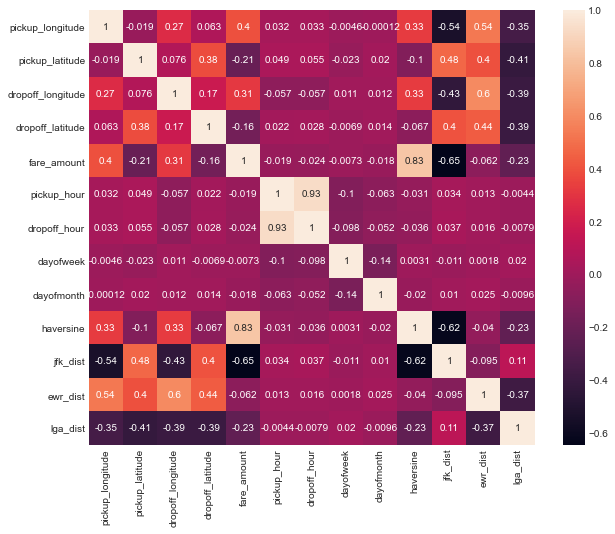

In [90]:
fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(model_df.corr(), annot = True)

There do not seem to be any multicollinearity between features 
I do not want to do any feature reduction since we are already short of features & none is actually required

### Model Building
#### Base Model : Linear Regression
The first model I'll make is a simple linear regression using the above features which would serve as a baseline model for later models

In [91]:

lr = LinearRegression()

In [92]:
y = model_df['fare_amount']
train = model_df.drop(columns=['fare_amount','pickup_datetime','dropoff_datetime'])

x_train,x_test,y_train,y_test = train_test_split(train,y,random_state=0,test_size=0.2)

In [93]:
x_train.head()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,pickup_hour,dropoff_hour,dayofweek,dayofmonth,haversine,jfk_dist,ewr_dist,lga_dist
919615,-73.990494,40.728741,-73.985397,40.759338,6,6,1,23,3.432989,20.426831,15.561507,9.715426
456763,-73.994698,40.750286,-73.979233,40.752918,15,15,6,14,1.336637,21.087382,16.020504,9.388578
95310,-73.972816,40.795486,-73.951721,40.792088,8,8,5,13,1.817563,22.367810,20.102244,6.869393
600199,-73.976997,40.745335,-73.978912,40.752747,17,17,4,19,0.840739,20.440231,17.202963,9.368204
823405,-73.973801,40.748074,-73.949738,40.776386,18,19,3,18,3.748187,20.398671,17.561358,6.502202


In [94]:
def metrics(train_pred, valid_pred, y_train, y_valid):
    """Calculate metrics:
       Root mean squared error and mean absolute percentage error"""
    
    # Root mean squared error
    train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
    valid_rmse = np.sqrt(mean_squared_error(y_valid, valid_pred))
    
    # Calculate absolute percentage error
    train_ape = abs((y_train - train_pred) / y_train)
    valid_ape = abs((y_valid - valid_pred) / y_valid)
    
    # Account for y values of 0
    train_ape[train_ape == np.inf] = 0
    train_ape[train_ape == -np.inf] = 0
    valid_ape[valid_ape == np.inf] = 0
    valid_ape[valid_ape == -np.inf] = 0
    
    train_mape = 100 * np.mean(train_ape)
    valid_mape = 100 * np.mean(valid_ape)
    
    return train_rmse, valid_rmse, train_mape, valid_mape

def evaluate(model, x_train, x_test, y_train, y_test):
    """Mean absolute percentage error"""
    
    # Make predictions
    train_pred = model.predict(x_train)
    valid_pred = model.predict(x_test)
    
    # Get metrics
    train_rmse, valid_rmse, train_mape, valid_mape = metrics(train_pred, valid_pred,
                                                             y_train, y_test)
    
    print(f'Training:   rmse = {round(train_rmse, 2)} \t mape = {round(train_mape, 2)}')
    print(f'Test: rmse = {round(valid_rmse, 2)} \t mape = {round(valid_mape, 2)}')

In [95]:
lr.fit(x_train,y_train)
y_pred=np.round(lr.predict(x_test),2)

LinearRegression()

In [96]:
evaluate(lr, x_train, x_test, y_train, y_test)

Training:   rmse = 4.5 	 mape = 22.54
Test: rmse = 5.63 	 mape = 22.7


The above value of RMSE will be considered as a baseline for our further modelling

### Random Forest Model
To check howmuch of improvement a non linear model can bring, I'm trying to build a random forest model. 
<br> In general, ensemble, non linear models seem to give good results, hence this try
<br> I'm not doing any hyperparameter optimization with this model

In [97]:

# Create the random forest
random_forest = RandomForestRegressor(n_estimators = 20, max_depth = 20, 
                                      max_features = None, oob_score = True, 
                                      bootstrap = True, verbose = 1, n_jobs = -1)

# Train on data
random_forest.fit(x_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  1.7min finished
C:\Users\H437006\Anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:832: UserWarning:

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.



RandomForestRegressor(max_depth=20, max_features=None, n_estimators=20,
                      n_jobs=-1, oob_score=True, verbose=1)

In [98]:
evaluate(random_forest, x_train, x_test, y_train, y_test)

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  20 out of  20 | elapsed:    2.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


Training:   rmse = 2.09 	 mape = 12.21
Test: rmse = 3.18 	 mape = 14.98


[Parallel(n_jobs=8)]: Done  20 out of  20 | elapsed:    0.4s finished


### XGBoost Model

Boosting models, especially XGBoost has shown to give really good results. Here, I'll be trying an XGBoost regressor with the optimized hyperparameters for the model identified through GridsearchCV

In [99]:
params = {
    'max_depth': 8, 
    'min_child_weight': 1,
    'eta':.03, 
    'subsample': 1, 
    'colsample_bytree': 0.8, 
    'objective':'reg:squarederror',
    'eval_metric':'rmse'
}

In [138]:
# Using GridSearchCV to find the best hyperparmeters for the XGBoost model
dtrain = xgb.DMatrix(train,label=y)
gridsearch_params = [
    (max_depth, min_child_weight)
    for max_depth in range(6,10)
    for min_child_weight in range(5,8)
]

# Define initial best params and RMSE
min_rmse = float("Inf")
best_params = None
for max_depth, min_child_weight in gridsearch_params:
    print("CV with max_depth={}, min_child_weight={}".format(
                             max_depth,
                             min_child_weight))
    # Update our parameters
    params['max_depth'] = max_depth
    params['min_child_weight'] = min_child_weight
    
    # Run CV
    cv_results = xgb.cv(
        params,
        dtrain,
        num_boost_round=1000,
        nfold=3,
        metrics={'rmse'},
        early_stopping_rounds=10
    )

    # Update best RMSE
    mean_rmse = cv_results['test-rmse-mean'].min()
    boost_rounds = cv_results['test-rmse-mean'].argmin()
    print("\tRMSE {} for {} rounds".format(mean_rmse, boost_rounds))
    if mean_rmse < min_rmse:
        min_rmse = mean_rmse
        best_params = (eta)

print("Best params: {}, RMSE: {}".format(best_params, min_rmse))

In [178]:

def XGBmodel(x_train,x_test,y_train,y_test,params):
    matrix_train = xgb.DMatrix(x_train,label=y_train)
    matrix_test = xgb.DMatrix(x_test,label=y_test)
    model=xgb.train(params=params,
                    dtrain=matrix_train,num_boost_round=1000, 
                    early_stopping_rounds=10,evals=[(matrix_train,'train'),(matrix_test,'test')])
    return model

xgb_regressor = XGBmodel(x_train,x_test,y_train,y_test,params)

[0]	train-rmse:14.61072	test-rmse:14.62444
[1]	train-rmse:14.19589	test-rmse:14.21178
[2]	train-rmse:13.79367	test-rmse:13.81103
[3]	train-rmse:13.42015	test-rmse:13.43994
[4]	train-rmse:13.04215	test-rmse:13.06388
[5]	train-rmse:12.69387	test-rmse:12.71835
[6]	train-rmse:12.33878	test-rmse:12.36494
[7]	train-rmse:11.99479	test-rmse:12.02298
[8]	train-rmse:11.68134	test-rmse:11.71240
[9]	train-rmse:11.35861	test-rmse:11.39186
[10]	train-rmse:11.06014	test-rmse:11.09595
[11]	train-rmse:10.77116	test-rmse:10.80960
[12]	train-rmse:10.47778	test-rmse:10.51818
[13]	train-rmse:10.19388	test-rmse:10.23605
[14]	train-rmse:9.91887	test-rmse:9.96329
[15]	train-rmse:9.65305	test-rmse:9.69949
[16]	train-rmse:9.39606	test-rmse:9.44486
[17]	train-rmse:9.14738	test-rmse:9.19802
[18]	train-rmse:8.91993	test-rmse:8.97323
[19]	train-rmse:8.68691	test-rmse:8.74317
[20]	train-rmse:8.48028	test-rmse:8.53901
[21]	train-rmse:8.26197	test-rmse:8.32311
[22]	train-rmse:8.05146	test-rmse:8.11434
[23]	train-rmse:

[193]	train-rmse:2.75724	test-rmse:3.07175
[194]	train-rmse:2.75580	test-rmse:3.07093
[195]	train-rmse:2.75419	test-rmse:3.07027
[196]	train-rmse:2.75258	test-rmse:3.06924
[197]	train-rmse:2.75099	test-rmse:3.06820
[198]	train-rmse:2.74959	test-rmse:3.06728
[199]	train-rmse:2.74829	test-rmse:3.06612
[200]	train-rmse:2.74671	test-rmse:3.06504
[201]	train-rmse:2.74533	test-rmse:3.06436
[202]	train-rmse:2.74382	test-rmse:3.06333
[203]	train-rmse:2.74245	test-rmse:3.06277
[204]	train-rmse:2.74111	test-rmse:3.06190
[205]	train-rmse:2.73982	test-rmse:3.06112
[206]	train-rmse:2.73846	test-rmse:3.06002
[207]	train-rmse:2.73732	test-rmse:3.05920
[208]	train-rmse:2.73629	test-rmse:3.05853
[209]	train-rmse:2.73510	test-rmse:3.05771
[210]	train-rmse:2.73374	test-rmse:3.05701
[211]	train-rmse:2.73241	test-rmse:3.05642
[212]	train-rmse:2.73108	test-rmse:3.05554
[213]	train-rmse:2.73007	test-rmse:3.05490
[214]	train-rmse:2.72886	test-rmse:3.05418
[215]	train-rmse:2.72753	test-rmse:3.05339
[216]	train

[384]	train-rmse:2.58214	test-rmse:2.98476
[385]	train-rmse:2.58142	test-rmse:2.98453
[386]	train-rmse:2.58092	test-rmse:2.98429
[387]	train-rmse:2.58030	test-rmse:2.98408
[388]	train-rmse:2.57951	test-rmse:2.98381
[389]	train-rmse:2.57811	test-rmse:2.98294
[390]	train-rmse:2.57782	test-rmse:2.98290
[391]	train-rmse:2.57721	test-rmse:2.98257
[392]	train-rmse:2.57697	test-rmse:2.98267
[393]	train-rmse:2.57641	test-rmse:2.98247
[394]	train-rmse:2.57607	test-rmse:2.98207
[395]	train-rmse:2.57514	test-rmse:2.98160
[396]	train-rmse:2.57489	test-rmse:2.98159
[397]	train-rmse:2.57442	test-rmse:2.98141
[398]	train-rmse:2.57394	test-rmse:2.98132
[399]	train-rmse:2.57315	test-rmse:2.98086
[400]	train-rmse:2.57195	test-rmse:2.98050
[401]	train-rmse:2.57094	test-rmse:2.97991
[402]	train-rmse:2.57026	test-rmse:2.97969
[403]	train-rmse:2.56980	test-rmse:2.97949
[404]	train-rmse:2.56888	test-rmse:2.97923
[405]	train-rmse:2.56823	test-rmse:2.97893
[406]	train-rmse:2.56769	test-rmse:2.97869
[407]	train

[575]	train-rmse:2.48522	test-rmse:2.95237
[576]	train-rmse:2.48468	test-rmse:2.95220
[577]	train-rmse:2.48415	test-rmse:2.95198
[578]	train-rmse:2.48366	test-rmse:2.95185
[579]	train-rmse:2.48318	test-rmse:2.95172
[580]	train-rmse:2.48285	test-rmse:2.95171
[581]	train-rmse:2.48264	test-rmse:2.95167
[582]	train-rmse:2.48234	test-rmse:2.95155
[583]	train-rmse:2.48189	test-rmse:2.95144
[584]	train-rmse:2.48153	test-rmse:2.95143
[585]	train-rmse:2.48122	test-rmse:2.95132
[586]	train-rmse:2.48020	test-rmse:2.95094
[587]	train-rmse:2.47993	test-rmse:2.95096
[588]	train-rmse:2.47971	test-rmse:2.95088
[589]	train-rmse:2.47947	test-rmse:2.95076
[590]	train-rmse:2.47896	test-rmse:2.95067
[591]	train-rmse:2.47854	test-rmse:2.95041
[592]	train-rmse:2.47819	test-rmse:2.95035
[593]	train-rmse:2.47799	test-rmse:2.95035
[594]	train-rmse:2.47791	test-rmse:2.95044
[595]	train-rmse:2.47770	test-rmse:2.95037
[596]	train-rmse:2.47717	test-rmse:2.95024
[597]	train-rmse:2.47694	test-rmse:2.95018
[598]	train

[766]	train-rmse:2.41859	test-rmse:2.93734
[767]	train-rmse:2.41843	test-rmse:2.93738
[768]	train-rmse:2.41819	test-rmse:2.93736
[769]	train-rmse:2.41767	test-rmse:2.93717
[770]	train-rmse:2.41733	test-rmse:2.93704
[771]	train-rmse:2.41714	test-rmse:2.93704
[772]	train-rmse:2.41703	test-rmse:2.93703
[773]	train-rmse:2.41663	test-rmse:2.93697
[774]	train-rmse:2.41648	test-rmse:2.93696
[775]	train-rmse:2.41626	test-rmse:2.93694
[776]	train-rmse:2.41574	test-rmse:2.93680
[777]	train-rmse:2.41540	test-rmse:2.93675
[778]	train-rmse:2.41492	test-rmse:2.93656
[779]	train-rmse:2.41479	test-rmse:2.93656
[780]	train-rmse:2.41442	test-rmse:2.93655
[781]	train-rmse:2.41412	test-rmse:2.93651
[782]	train-rmse:2.41387	test-rmse:2.93649
[783]	train-rmse:2.41380	test-rmse:2.93643
[784]	train-rmse:2.41361	test-rmse:2.93639
[785]	train-rmse:2.41331	test-rmse:2.93634
[786]	train-rmse:2.41309	test-rmse:2.93636
[787]	train-rmse:2.41271	test-rmse:2.93624
[788]	train-rmse:2.41262	test-rmse:2.93622
[789]	train

[957]	train-rmse:2.36721	test-rmse:2.92824
[958]	train-rmse:2.36700	test-rmse:2.92824
[959]	train-rmse:2.36677	test-rmse:2.92809
[960]	train-rmse:2.36656	test-rmse:2.92805
[961]	train-rmse:2.36652	test-rmse:2.92805
[962]	train-rmse:2.36638	test-rmse:2.92803
[963]	train-rmse:2.36634	test-rmse:2.92803
[964]	train-rmse:2.36603	test-rmse:2.92794
[965]	train-rmse:2.36585	test-rmse:2.92791
[966]	train-rmse:2.36508	test-rmse:2.92764
[967]	train-rmse:2.36492	test-rmse:2.92762
[968]	train-rmse:2.36476	test-rmse:2.92762
[969]	train-rmse:2.36421	test-rmse:2.92753
[970]	train-rmse:2.36417	test-rmse:2.92750
[971]	train-rmse:2.36364	test-rmse:2.92739
[972]	train-rmse:2.36336	test-rmse:2.92741
[973]	train-rmse:2.36299	test-rmse:2.92729
[974]	train-rmse:2.36260	test-rmse:2.92723
[975]	train-rmse:2.36245	test-rmse:2.92723
[976]	train-rmse:2.36219	test-rmse:2.92724
[977]	train-rmse:2.36207	test-rmse:2.92721
[978]	train-rmse:2.36185	test-rmse:2.92710
[979]	train-rmse:2.36149	test-rmse:2.92704
[980]	train

The above results are with only ~10% of the dataset. If we use more data, the results could improve

The same approach used as above can be used for predicting tip amount. The target varibale only changes

## C. If you were a taxi owner, how would you maximize your earnings in a day?

Assumptions : <br>A taxi owner owns the medallion for a given taxi and can have several drivers drive their cab.
    <br>A taxi driver is represented by the hack license

In [100]:
#Create the date column from pickup date
taxi_df['date'] = taxi_df.pickup_datetime.dt.date

In [101]:
# What is the average daily earnings of a taxi?
taxi_df.groupby(['medallion', 'date'])['total_amount'].sum().mean()

150.07595237840994

In [102]:
# What is the average daily earnings of a taxi driver?
taxi_df.groupby(['hack_license', 'date'])['total_amount'].sum().mean()

100.12725428316996

To maximize my earnings, as a taxi owner, I can do two things:
    <br>Either stick to the routes that give the highest daily earnings
    <br>Or lease out my medallion taxi to multiple drivers to maximize drive time and stick to routes that earn the highest revenue per hour

In [105]:
# The routes with the highest revenues and the number of trips required in each of them are:
taxi_df4['date'] = taxi_df4.pickup_datetime.dt.date
ordered = taxi_df4.groupby(['route', 'date'])['total_amount'].agg({sum, len}).reset_index()
ordered.sort_values(['sum', 'len'], ascending=[False, False]).head(10)

,route,date,len,sum
5295,"40.75, -73.99 : 40.76, -73.98",2013-04-13,1170.0,10029.58
7845,"40.77, -73.87 : 40.76, -73.98",2013-04-14,232.0,9791.26
6918,"40.76, -73.98 : 40.77, -73.87",2013-04-14,226.0,9001.40
6775,"40.76, -73.98 : 40.75, -73.99",2013-04-13,1028.0,8824.45
6223,"40.76, -73.97 : 40.75, -73.99",2013-04-13,747.0,7931.05
5313,"40.75, -73.99 : 40.76, -73.99",2013-04-13,947.0,7914.79
6776,"40.76, -73.98 : 40.75, -73.99",2013-04-14,985.0,7862.84
6224,"40.76, -73.97 : 40.75, -73.99",2013-04-14,720.0,7641.68
1707,"40.73, -73.99 : 40.75, -73.99",2013-04-13,639.0,7080.16
4744,"40.75, -73.98 : 40.76, -73.97",2013-04-13,901.0,6954.51


In [106]:
# What route generates the highest revenue per hour?
taxidf5 = taxi_df4.copy()
taxidf5['trip_time_in_hours'] = 1.0*taxidf5['trip_time_in_secs']/3600
taxidf5['earnings_per_hour'] = 1.0*taxidf5['total_amount']/taxidf5['trip_time_in_hours']
taxidf5.tail()

,medallion,hack_license,vendor_id,rate_code,pickup_datetime,dropoff_datetime,passenger_count,trip_time_in_secs,trip_distance,pickup_longitude,...,total_amount,speed,Hour,DayofWeek,pickup_geocode,dropoff_geocode,route,date,trip_time_in_hours,earnings_per_hour
975635,20EA444668EF9FFAE2D5EB996883E485,A97AFD12E9575C250388D573C3EE6282,CMT,1,2013-04-16 07:52:01,2013-04-16 07:57:46,1,345,0.7,-73.97,...,6.0,7.304348,7,5.0,"40.77, -73.97","40.77, -73.96","40.77, -73.97 : 40.77, -73.96",2013-04-16,0.095833,62.608696
975636,6516FB0E31147DEC6A371E53A4F92BA7,B14F57CF349AC31A1890A4F2D10307E1,CMT,1,2013-04-23 01:44:55,2013-04-23 01:50:32,1,337,2.2,-73.98,...,10.8,23.501484,1,NaN,"40.73, -73.98","40.76, -73.97","40.73, -73.98 : 40.76, -73.97",2013-04-23,0.093611,115.370920
975637,977D2C988810E2B86E04403B8E7420AC,4D99D802E67E875D6ADCF281C0B92D79,CMT,1,2013-04-20 00:14:15,2013-04-20 00:27:48,1,813,5.1,-73.98,...,21.0,22.583026,0,2.0,"40.74, -73.98","40.71, -74.01","40.74, -73.98 : 40.71, -74.01",2013-04-20,0.225833,92.988930
975640,A408F138216DE3E432BBF2FD88665A88,82EA6A085709BE93AA9DA363A85A04FF,CMT,1,2013-04-23 01:53:07,2013-04-23 01:56:40,1,212,1.1,-73.99,...,7.5,18.679245,1,1.0,"40.73, -73.99","40.74, -73.98","40.73, -73.99 : 40.74, -73.98",2013-04-23,0.058889,127.358491
975641,253C9C1C3A11CD9B78894BC37D2A0991,2372B543B0435613250186F68B6C56B8,CMT,1,2013-04-18 13:41:44,2013-04-18 13:53:02,1,677,1.3,-73.99,...,10.5,6.912851,13,4.0,"40.75, -73.99","40.77, -73.98","40.75, -73.99 : 40.77, -73.98",2013-04-18,0.188056,55.834564


In [107]:
# Let's look at the average earnings per hour across routes and focus on those whose average is the highest
taxidf5.groupby(['route'])['earnings_per_hour'].mean().sort_values(ascending=False).head(10)

route
40.77, -73.99 : 40.77, -73.99    454.344372
40.71, -74.01 : 40.71, -74.01    347.424307
40.72, -74.0 : 40.72, -74.0      305.993437
40.73, -74.0 : 40.73, -74.0      264.627409
40.72, -73.99 : 40.72, -73.99    202.448527
40.76, -73.99 : 40.76, -73.99    190.385579
40.76, -73.98 : 40.76, -73.98    189.174426
40.76, -74.0 : 40.76, -74.0      188.374836
40.77, -73.98 : 40.77, -73.98    182.637143
40.75, -73.98 : 40.75, -73.98    175.451122
Name: earnings_per_hour, dtype: float64

These trips all start and end in the same geocodes
<br>so it is the shorter trips that maximize revenues.

## D. If you were a taxi owner, how would you minimize your work time while retaining the average wages earned by a typical taxi in the dataset?

In [108]:
# What is the average daily earnings of a taxi?
taxi_df.groupby(['medallion', 'date'])['total_amount'].sum().mean()

150.07595237840994

To minimize the work time and retain the above average wage:
    <br> * I can choose the routes that give the highest earnings per hour
    <br> * I can work during the busiest hours so that the time wasted on waiting for bookings is minimized
    <br> * I can choose the routes that would provide the best tips
    <br> * I can use the above three strategies till my average wages for a medallion taxi is met or I can change drivers when the average wage for a driver is met 
    <br> * After every ride end, I'll advise the driver to move to the nearest busiest spot/pickup location with the highest fare per hour, within a particular radius so that he would get a ride faster

In [109]:
taxidf6 = taxidf5.copy()

Text(0.5, 55.5, 'Day of Week')

Text(73.5, 0.5, 'Hour of Day')

Text(0.5, 1.0, 'Passengers traveling by taxi in April 2013')

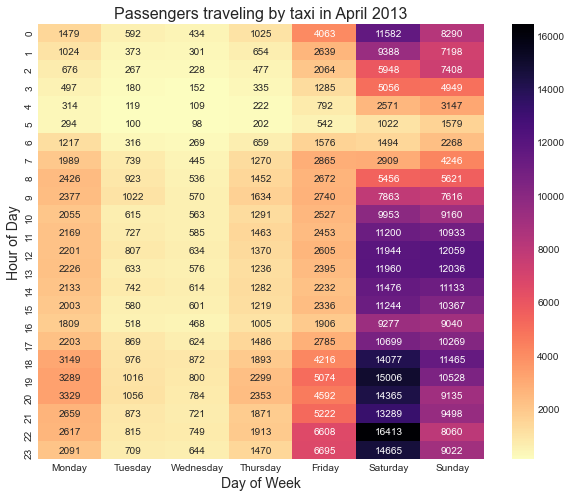

In [110]:
# What are the busiest days and hours for taxi drivers?
busiest_df = taxidf6.groupby(['DayofWeek','Hour'])['passenger_count'].size().reset_index()
busiest_piv = pd.pivot_table(busiest_df, values="passenger_count",index=["Hour"], columns=["DayofWeek"], fill_value=0)
busiest_piv.columns = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
busiest_piv = busiest_piv[['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']]

#plot pivot table as heatmap using seaborn
fig, ax = plt.subplots(figsize=(10,8))
ax = sns.heatmap(busiest_piv, ax=ax, cmap='magma_r', annot=True, fmt='g')
ax.set_xlabel('Day of Week', fontsize=14)
ax.set_ylabel('Hour of Day', fontsize=14)
ax.set_title('Passengers traveling by taxi in April 2013', fontsize=16)

We can see that the demand for taxis is maximum during the time 8am-10am & 6pm-8pm on weekdays
<br>At the same time, the demand for taxis from midnight till about 5am on these days are very less. So these slots maybe skipped

## E. If you run a taxi company with 10 taxis, how would you maximize your earnings?

In [120]:
# Identify clusters in the city based on the demand. 
# Here I'm using pickup coordinates and using a simple kmeasn clustering algorithms to identify clusters
# Initialize the class object
kmeans = KMeans(n_clusters= 10)
 
# predict the labels of clusters
label = kmeans.fit_predict(train[['pickup_longitude','pickup_latitude']])

In [123]:
train_vis = train.copy()
train_vis['cluster'] = label

In [141]:
# Visualize the 10 clusters in Newyork
data = [go.Scattermapbox(
            lat= train_vis[train_vis.cluster==0][:10000]['pickup_latitude'] ,
            lon= train_vis[train_vis.cluster==0][:10000]['pickup_longitude'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'lightcoral',
                opacity = .8),
          ),
       go.Scattermapbox(
            lat= train_vis[train_vis.cluster==1][:10000]['pickup_latitude'] ,
            lon= train_vis[train_vis.cluster==1][:10000]['pickup_longitude'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'gold',
                opacity = .8),
          ),
        go.Scattermapbox(
            lat= train_vis[train_vis.cluster==2][:50000]['pickup_latitude'] ,
            lon= train_vis[train_vis.cluster==2][:50000]['pickup_longitude'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'deepskyblue',
                opacity = .8),
          ),
        go.Scattermapbox(
            lat= train_vis[train_vis.cluster==3][:10000]['pickup_latitude'] ,
            lon= train_vis[train_vis.cluster==3][:10000]['pickup_longitude'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'lightgreen',
                opacity = .8),
          ),
        go.Scattermapbox(
            lat= train_vis[train_vis.cluster==4][:10000]['pickup_latitude'] ,
            lon= train_vis[train_vis.cluster==4][:10000]['pickup_longitude'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'plum',
                opacity = .8),
          ),
        go.Scattermapbox(
            lat= train_vis[train_vis.cluster==5][:10000]['pickup_latitude'] ,
            lon= train_vis[train_vis.cluster==5][:10000]['pickup_longitude'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'orange',
                opacity = .8),
          ),
        go.Scattermapbox(
            lat= train_vis[train_vis.cluster==6][:10000]['pickup_latitude'] ,
            lon= train_vis[train_vis.cluster==6][:10000]['pickup_longitude'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'purple',
                opacity = .8),
          ),
        go.Scattermapbox(
            lat= train_vis[train_vis.cluster==7][:10000]['pickup_latitude'] ,
            lon= train_vis[train_vis.cluster==7][:10000]['pickup_longitude'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'magenta',
                opacity = .8),
          ),
        go.Scattermapbox(
            lat= train_vis[train_vis.cluster==8][:10000]['pickup_latitude'] ,
            lon= train_vis[train_vis.cluster==8][:10000]['pickup_longitude'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'mediumorchid',
                opacity = .8),
          ),
        go.Scattermapbox(
            lat= train_vis[train_vis.cluster==9][:10000]['pickup_latitude'] ,
            lon= train_vis[train_vis.cluster==9][:10000]['pickup_longitude'],
            mode='markers',
            marker=dict(
                size= 4,
                color = 'white',
                opacity = .8),
          )]
layout = go.Layout(autosize=False,
                   mapbox= dict(accesstoken="pk.eyJ1Ijoic2hhejEzIiwiYSI6ImNqYXA3NjhmeDR4d3Iyd2w5M2phM3E2djQifQ.yyxsAzT94VGYYEEOhxy87w",
                                bearing=10,
#                                 pitch=60,
                                zoom=13,
                                center= dict(
                                         lat=40.721319,
                                         lon=-73.987130),
                                style= "mapbox://styles/shaz13/cjiog1iqa1vkd2soeu5eocy4i"),
                    width=1200,
                    height=700, title = "Cluster locations in NewYork")
fig = dict(data=data, layout=layout)
iplot(fig)

Assumptions:
    <br> * Each taxi can be driven by multiple drivers working shifts in a day

1. To maximize the revenue from the taxis, I will ensure that the taxis are deployed at the busiest pickup and dropoff location which we identified previously
2. I'll ensure availability of taxis on the routes where the fares are most consistent as well
3. To avoid my own taxis competing with each other, I'd try to deploy the taxis in 10 different clusters as identified above
4. Friday, Saturday & Sunday afternon till midnight are the durations for which the taxi demand is maximum. I'll ensure availability of taxi during this period by having enough number of drivers to work in shifts and also having the taxis serviced in advance and ready for this period
5. Instruct taxi drivers to focus on the routes with the highest earnings per hour (or earnings per mile)